<a href="https://colab.research.google.com/github/ReichsMarschall310/CV_Video_Super-resolution/blob/main/Video_Super-resolution_with_U-Net_and_Optical_Flow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraires 

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import cv2
from keras.models import Sequential
from tensorflow.keras.utils import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt
import torch 
from keras import layers
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Helper Functions for Visualization

In [ ]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

In [ ]:
def plot_before_after(predicted_frames, frames, k=5):
    '''
    predicted_frames: super-resolution video frames 
    frames: blurred frames
    '''
    for i in range(k):
      plt.figure(figsize=(10,10))
      plt.subplot(1,2,1)
      plt.title('High Resolution Frames', color = 'green', fontsize = 20)
      plt.imshow(predicted_frames[i])
      plt.axis('off')
      plt.subplot(1,2,2)
      plt.title('low Resolution Frames ', color = 'black', fontsize = 20)
      plt.imshow(frames[i])
      plt.axis('off')

# Image Data Preparation (do not run)

In [ ]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '/content/drive/MyDrive/mit computer vision project/dataset/Raw Data/high_res'
#path = '/content/drive/MyDrive/mit computer vision project/Data/HR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '854.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '/content/drive/MyDrive/mit computer vision project/dataset/Raw Data/low_res'
#path = '/content/drive/MyDrive/mit computer vision project/Data/LR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '854.jpg':
        break
     else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 855/855 [00:12<00:00, 68.63it/s] 


## Data Visualization

In [ ]:
for i in range(4):
    a = np.random.randint(0,854)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

## Train/val/test Split and Data Preprocessing

In [ ]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:800]
validation_low_image = low_img[700:800]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[800:]
test_low_image = low_img[800:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)


Shape of training images: (700, 256, 256, 3)
Shape of test images: (55, 256, 256, 3)
Shape of validation images: (100, 256, 256, 3)


# Image Super-resolution Model Training (do not run)

In [ ]:
def down(filters , kernel_size, apply_batch_normalization = True):
  
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout = False):
 
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:
        upsample.dropout(0.2)
    upsample.add(keras.layers.LeakyReLU())
    return upsample

def model():
    inputs = layers.Input(shape= [SIZE,SIZE,3])
    d1 = down(128,(3,3),False)(inputs)
    d2 = down(128,(3,3),False)(d1)
    d3 = down(256,(3,3),True)(d2)
    d4 = down(512,(3,3),True)(d3)
    
    d5 = down(512,(3,3),True)(d4)
    #upsampling
    u1 = up(512,(3,3),False)(d5)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256,(3,3),False)(u1)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128,(3,3),False)(u2)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128,(3,3),False)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3,(3,3),False)(u4)
    u5 = layers.concatenate([u5,inputs])
    output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

model = model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  147584      ['sequential[0][0]']             
                                                                                              

This function can be used to improve the resolution of an image because it defines a convolutional neural network architecture that is designed to upscale and reconstruct images. 

The network is built with a series of downsample and upsample blocks, where the downsample blocks gradually reduce the spatial resolution of the input image while increasing the number of channels. The upsample blocks then use transposed convolutional layers to increase the spatial resolution of the image while decreasing the number of channels. The skip connections between the downsample and upsample blocks allow the network to capture and use high-frequency details from the input image during the upscaling process.

By training this network on a dataset of low-resolution images and their corresponding high-resolution counterparts, the network can learn to generate high-resolution images from low-resolution inputs. Therefore, when the network is used to process a low-resolution image, it can produce an output image with a higher resolution that is more visually pleasing and contains more details.

## Compile (Use PSNR as Metrics)

In [ ]:
import tensorflow as tf

def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
    return 20 * log10(1/ (mse ** 0.5))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

## Compile (Use SSIM_Loss as Loss, and 'acc'& SSIM as Metrics)

In [ ]:
# Loss function
def ssim_loss(y_true, y_pred):
  return -(tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2.0)))
  
# metrics function
def SSIM(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2.0))

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss=ssim_loss, metrics=[SSIM, 'accuracy'])


In [ ]:
from tensorflow.keras.utils import plot_model

In [ ]:
plot_model(model, to_file='/content/drive/MyDrive/mit computer vision project/model_SSIM.png', show_shapes=True)

## Fitting model

In [ ]:
model.fit(train_low_image, train_high_image, epochs = 50, batch_size = 4,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/50
175/175 [==============================] - 12s 70ms/step - loss: -0.9341 - SSIM: 0.9341 - accuracy: 0.7592 - val_loss: -0.9364 - val_SSIM: 0.9364 - val_accuracy: 0.8495
Epoch 2/50
175/175 [==============================] - 11s 65ms/step - loss: -0.9404 - SSIM: 0.9404 - accuracy: 0.7908 - val_loss: -0.9270 - val_SSIM: 0.9270 - val_accuracy: 0.7138
Epoch 3/50
175/175 [==============================] - 11s 65ms/step - loss: -0.9433 - SSIM: 0.9433 - accuracy: 0.7898 - val_loss: -0.9447 - val_SSIM: 0.9447 - val_accuracy: 0.7930
Epoch 4/50
175/175 [==============================] - 11s 65ms/step - loss: -0.9450 - SSIM: 0.9450 - accuracy: 0.7858 - val_loss: -0.9257 - val_SSIM: 0.9257 - val_accuracy: 0.7013
Epoch 5/50
175/175 [==============================] - 11s 65ms/step - loss: -0.9466 - SSIM: 0.9466 - accuracy: 0.8016 - val_loss: -0.9371 - val_SSIM: 0.9371 - val_accuracy: 0.7244
Epoch 6/50
175/175 [==============================] - 11s 65ms/step - loss: -0.9481 - SSIM: 0.9481 -

In [ ]:
test_low_image[0]

In [ ]:
model.save("/content/drive/MyDrive/mit computer vision project/lrithr_model_Metric=SSIM+Loss=loss_ssim.h5")

## Prediction Visualization

In [ ]:
# PSNR 2nd time
for i in range(1,10):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

In [ ]:
# PSNR
for i in range(1,10):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

1/1 [==============================] - 0s 30ms/step


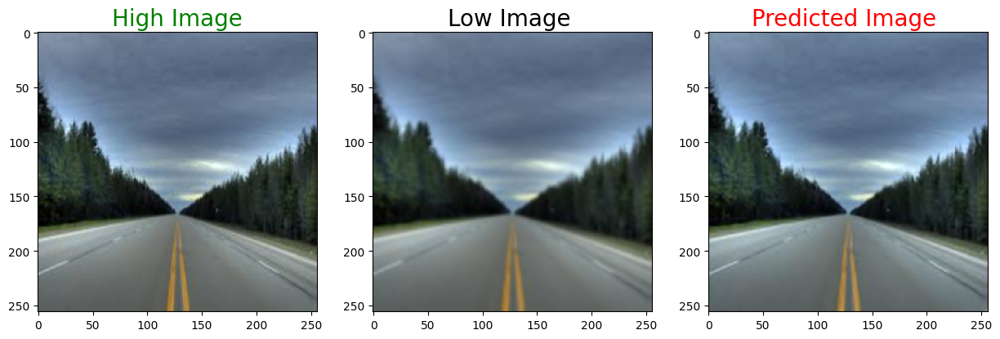

1/1 [==============================] - 0s 32ms/step


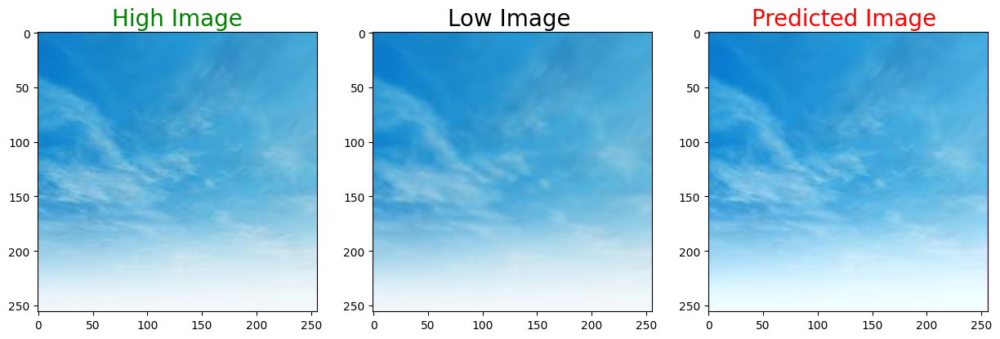

1/1 [==============================] - 0s 29ms/step


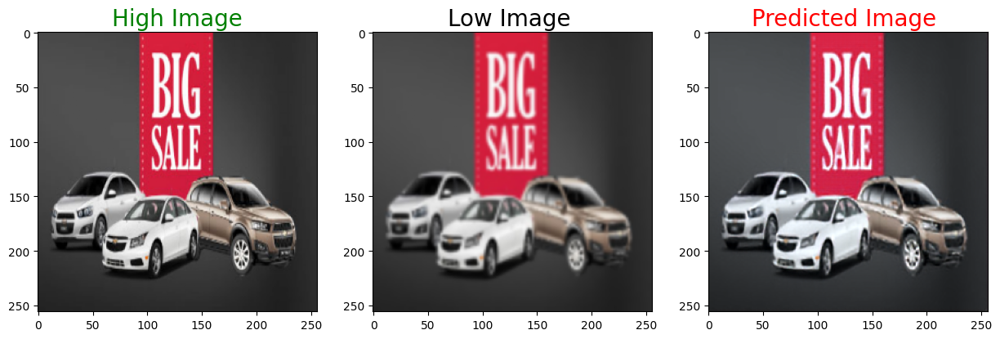

1/1 [==============================] - 0s 27ms/step


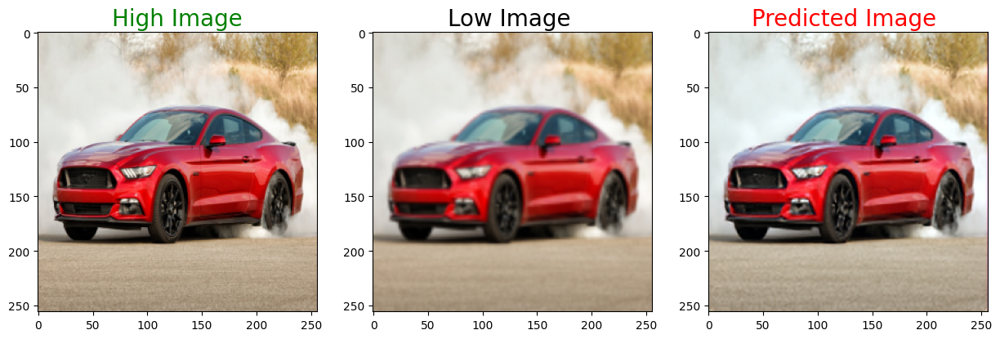

1/1 [==============================] - 0s 25ms/step


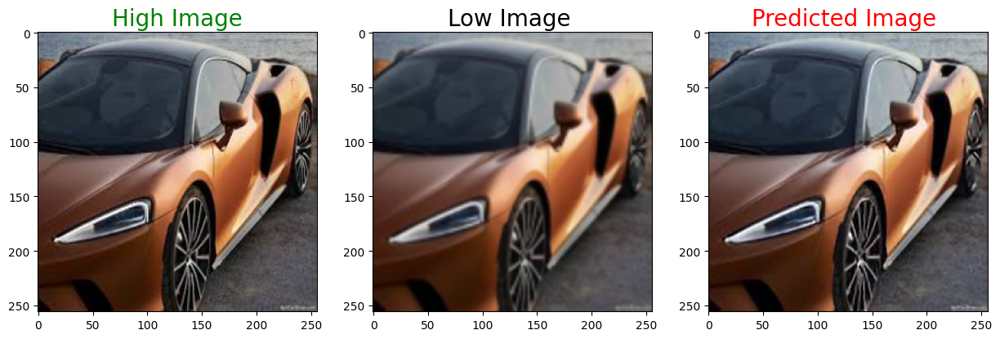

1/1 [==============================] - 0s 30ms/step


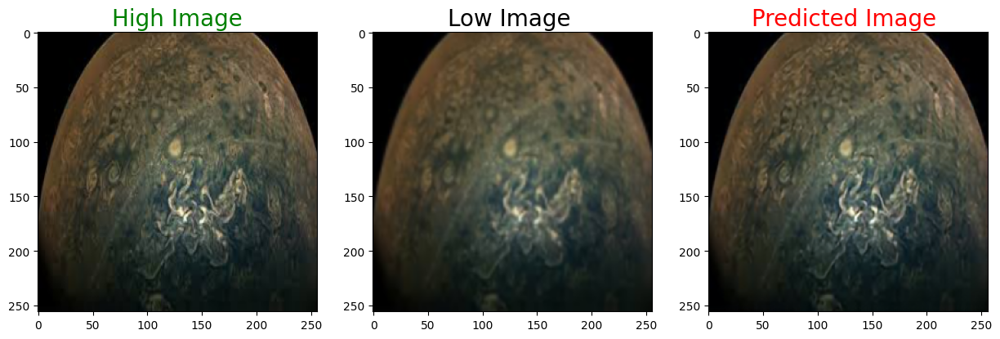

1/1 [==============================] - 0s 26ms/step


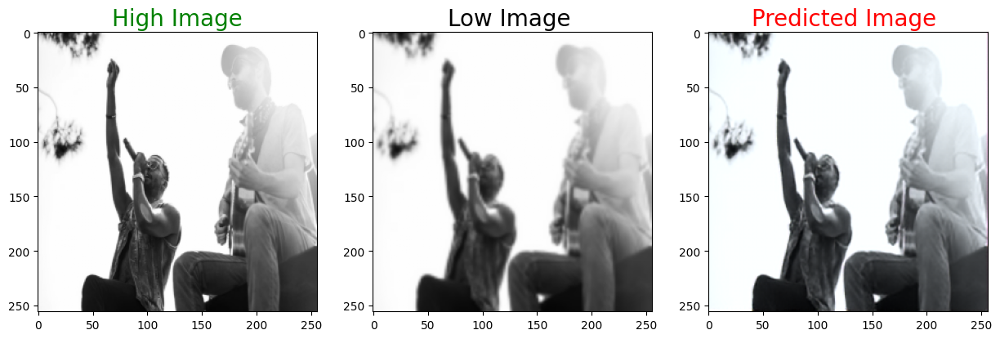

1/1 [==============================] - 0s 31ms/step


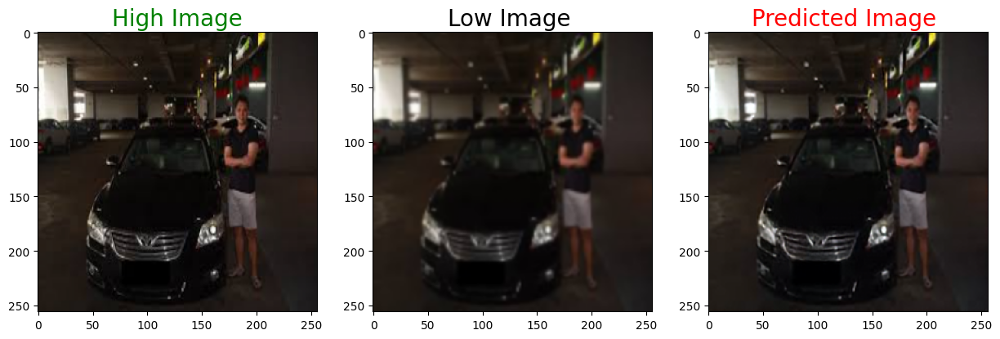

1/1 [==============================] - 0s 28ms/step


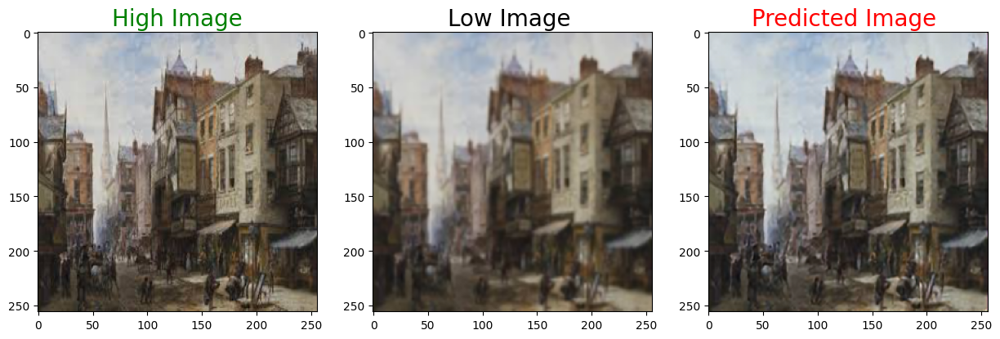

In [ ]:
# SSIM
for i in range(1,10):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

1/1 [==============================] - 8s 8s/step


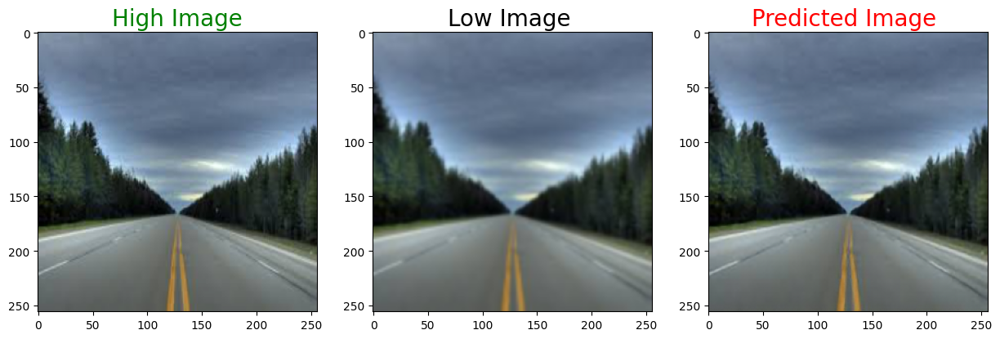

1/1 [==============================] - 0s 37ms/step


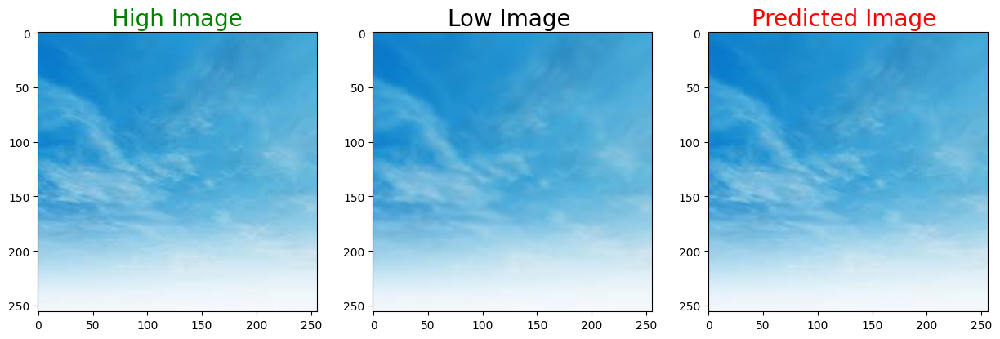

1/1 [==============================] - 0s 27ms/step


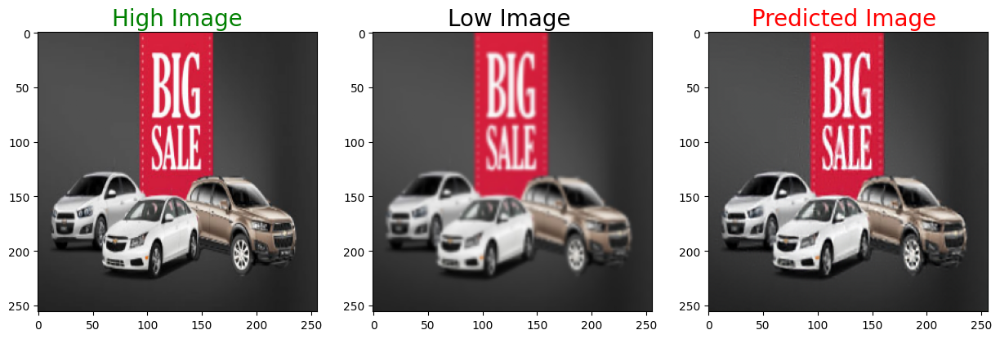

1/1 [==============================] - 0s 51ms/step


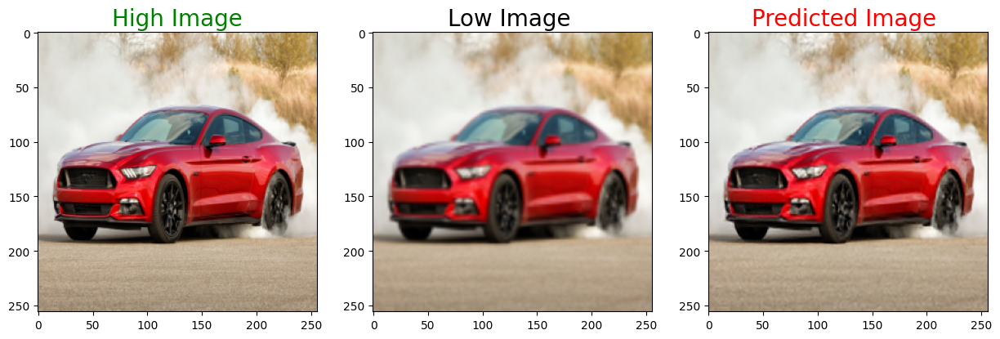

1/1 [==============================] - 0s 99ms/step


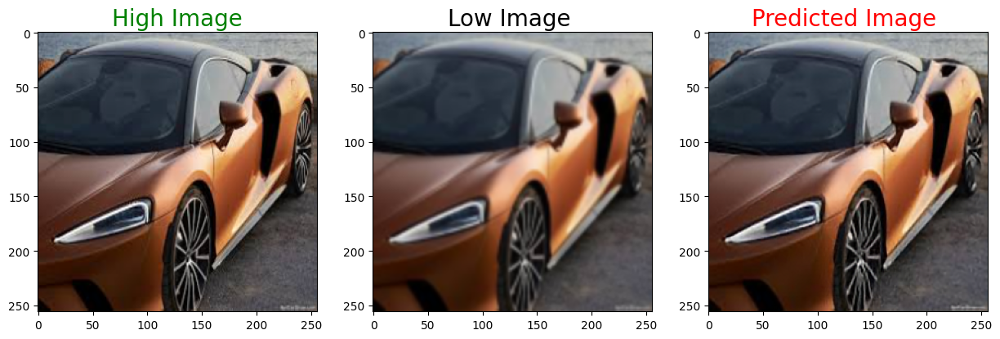

1/1 [==============================] - 0s 34ms/step


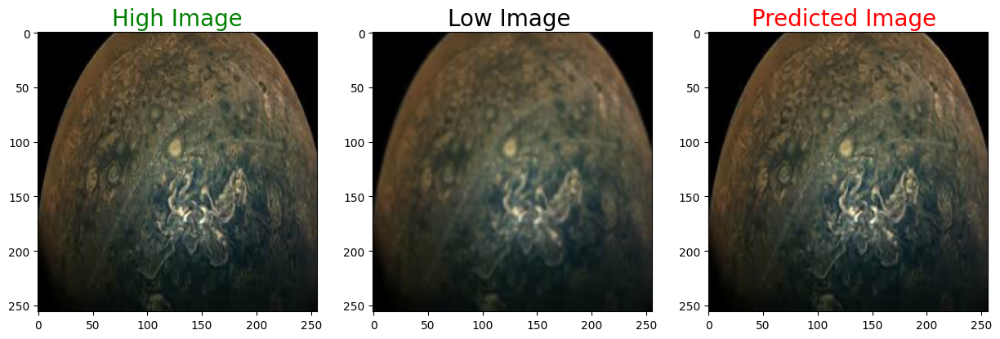

1/1 [==============================] - 0s 29ms/step


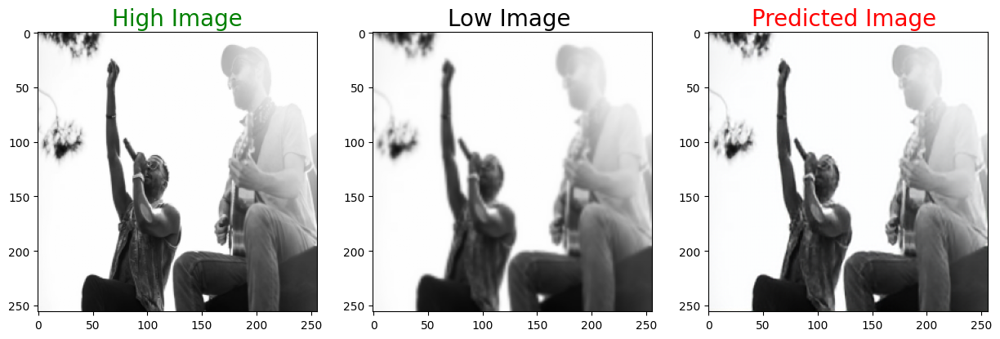

1/1 [==============================] - 0s 31ms/step


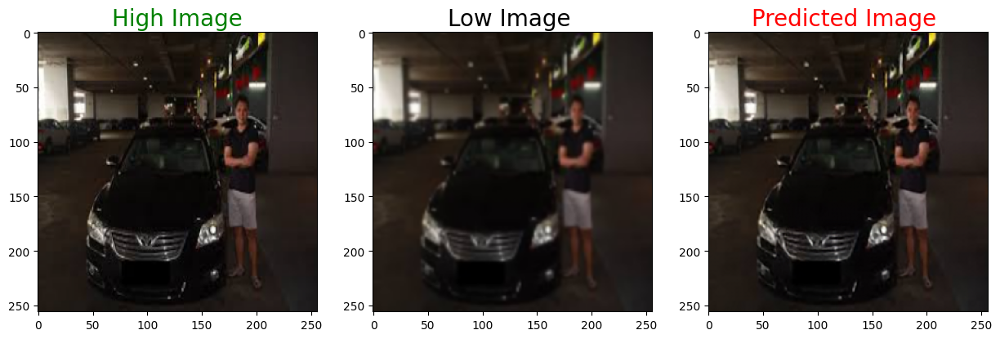

1/1 [==============================] - 0s 34ms/step


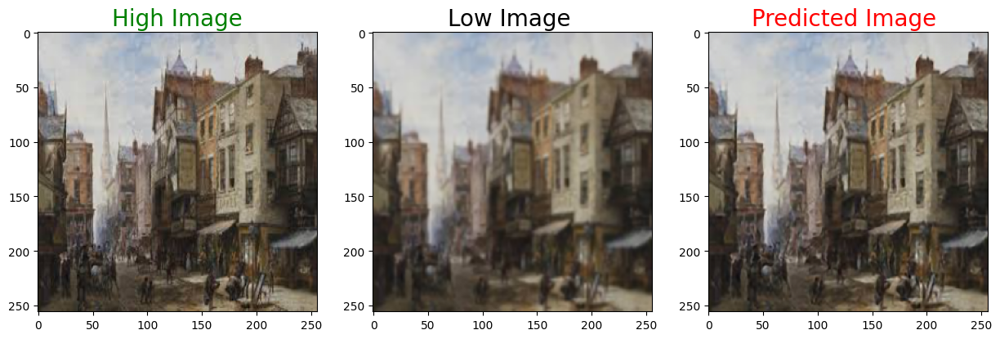

In [ ]:
for i in range(1,10):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

In [ ]:
# model.evaluate(test_low_image, test_high_image)
# model with MAE

2/2 [==============================] - 6s 2s/step - loss: 0.0168 - acc: 0.8657


[0.016799604520201683, 0.8656649589538574]

In [ ]:
model.evaluate(test_low_image, test_high_image)
# 0509 model with MSE

2/2 [==============================] - 6s 2s/step - loss: 9.8755e-04 - acc: 0.8808


[0.0009875473333522677, 0.8807867169380188]

In [ ]:
model.evaluate(test_low_image, test_high_image)
# 0510 model with metrics = PSNR, Loss = MSE

2/2 [==============================] - 6s 2s/step - loss: 0.0051 - PSNR: 22.9544


[0.005060283001512289, 22.954357147216797]

In [ ]:
# 2nd time
model.evaluate(test_low_image, test_high_image)
# 0510 model with metrics = PSNR, Loss = MSE

2/2 [==============================] - 1s 124ms/step - loss: 0.0043 - PSNR: 23.6629


[0.004334678407758474, 23.662864685058594]

In [ ]:
model.evaluate(test_low_image, test_high_image)
# 0510 model with metrics = SSIM, Loss = loss_ssim

2/2 [==============================] - 0s 138ms/step - loss: -0.9470 - SSIM: 0.9470 - accuracy: 0.7865


[-0.9469998478889465, 0.94700026512146, 0.7864826321601868]

# Load pre-trained model

In [ ]:
# load the model that were previously trained
# If using user-defined loss or metrics. need to add custom_objects={'PSNR': PSNR} OR  custom_objects={'SSIM': SSIM, 'ssim_loss': ssim_loss}
model = keras.models.load_model("/content/drive/MyDrive/mit computer vision project/lrithr_model_Metric=SSIM+Loss=loss_ssim.h5", custom_objects={'SSIM': SSIM, 'ssim_loss': ssim_loss})

# Video-related Helper Function
Workflow:

1. **video preparation + frame-wise super-resolution**: use resize_video() to resize video material, then use blurr_video_and_prediction() to generate low-resolution video and predicted high-resolution video

In [ ]:
def resize_video(dir_in, dir_out):
    """
    resize a video so we can use the image super-resolution model on it 
    dir_in: input directory, e.g. '/content/drive/MyDrive/mit computer vision project/sky.mp4'
    dir_out: output directory, e.g. '/content/drive/MyDrive/mit computer vision project/sky_resized.mp4'
    """
    # Load the input video
    cap = cv2.VideoCapture(dir_in)

    # Get the frame dimensions
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Calculate the center crop dimensions
    crop_size = min(width, height)
    x = (width - crop_size) // 2
    y = (height - crop_size) // 2

    # Create a video writer object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(dir_out, fourcc, 30, (256, 256))
    

    # Loop through the frames
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # Apply center crop
        cropped_frame = frame[y:y+crop_size, x:x+crop_size]
        
        # Resize to 256 by 256
        resized_frame = cv2.resize(cropped_frame, (256, 256))
        
        # Write the resized frame to the output video
        out.write(resized_frame)
        
        # Exit on ESC key press
        if cv2.waitKey(1) == 27:
            break

    # Release the video capture, writer, and close all windows
    cap.release()
    out.release()
    cv2.destroyAllWindows()



In [ ]:
def read_video_to_frames(dir_in):
    '''
    dir_in: input video directory, e.g. '/content/drive/MyDrive/mit computer vision project/sky_resized.mp4'
    return frames
    '''
    cap = cv2.VideoCapture(dir_in)
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # list of video frames
    frames = []

    while(cap.isOpened()):
        # read frame from the video
        ret, frame = cap.read()
        
        if ret is False:
            break
        #frame = cv2.resize(frame, (256,256))
        #frame = frame[:, 80:80+240]
        frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
        frames.append(frame)

    cap.release()

    # scale frame to 0-1
    #frames = np.array(frames) / 255.
    frames = np.array(frames)
    print("frames size:", frames.shape, "# (nb_frames, height, width, channel)")
    return frames


In [ ]:
def blurr_video_and_prediction(dir_resize, dir_out_blur, dir_out_pred, k_size = 3):
  '''
  blur input resized video
  predict higher-resolution video
  save blurred and predicted video
  return blurred and predicted frames
  '''
  cap = cv2.VideoCapture(dir_resize)
  fps = int(cap.get(cv2.CAP_PROP_FPS))
  width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

  # original video frames
  frames = read_video_to_frames(dir_resize)

  # blurred lr frames
  blurred_frames = np.zeros_like(frames)
  for i in range(frames.shape[0]):
    blurred_frames[i] = cv2.blur(frames[i],(k_size, k_size))
  
  # predicted hr frames
  predicted_frames = np.zeros_like(frames, dtype = float)
  for i in range(frames.shape[0]):
    pred = np.clip(model.predict((blurred_frames[i]/255.).reshape(1, 256, 256, 3)), 0.0, 1.0).reshape(256, 256, 3)
    predicted_frames[i] = pred

  # sanity check first 5 frames 
  for i in range(5):
    plot_images(frames[i], blurred_frames[i], predicted_frames[i])
    
  # Define output video path and parameters
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  out = cv2.VideoWriter(dir_out_blur, fourcc, fps, (width, height))

  # Loop through the frames and write to the output video
  for i in range(blurred_frames.shape[0]):
    # Convert BGR to RGB
      frame_rgb = cv2.cvtColor((blurred_frames[i]).astype(np.uint8), cv2.COLOR_BGR2RGB)
      out.write(frame_rgb)

  out = cv2.VideoWriter(dir_out_pred, fourcc, fps, (width, height))

  # Loop through the frames and write to the output video
  for i in range(predicted_frames.shape[0]):
      # Convert BGR to RGB
      frame_rgb = cv2.cvtColor((predicted_frames[i] * 255).astype(np.uint8), cv2.COLOR_BGR2RGB)
      out.write(frame_rgb)

    # Release the output video and close all windows
  out.release()
  return blurred_frames, predicted_frames

In [ ]:
def save_frame_images(dir_in, dir_out):
    '''save frames as images'''
    vidcap = cv2.VideoCapture(dir_in)
    success,image = vidcap.read()
    count = 0
    while success:
      cv2.imwrite(dir_out + "%3d.jpg" % count, image)     # save frame as JPEG file      
      success,image = vidcap.read()
      #print('Read a new frame: ', success)
      count += 1

In [ ]:
def save_video(frames,out_path, fps = 30, width = 256, height = 256):
    # Define output video path and parameters
    #out_path = '/content/drive/MyDrive/mit computer vision project/sky_blended.mp4'
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(out_path, fourcc, fps, (width, height))
    if np.all(frames<=1):
      frames = frames * 255
    # Loop through the frames and write to the output video
    for i in range(frames.shape[0]):
        frame_rgb = cv2.cvtColor(((frames[i])).astype(np.uint8), cv2.COLOR_BGR2RGB)
        out.write(frame_rgb)

    # Release the output video and close all windows
    out.release()

In [ ]:
import os
import subprocess

In [ ]:
def create_video_from_images(image_folder, output_video_file):
    # Set the framerate for the output video (1 image per second)
    framerate = 30
    
    # Set the input and output paths
    input_path = os.path.join(image_folder, '%3d.jpg') # or '*.jpg' depending on the image format
    output_path = output_video_file
    
    # Run the ffmpeg command to create the video
    command = ['ffmpeg', '-framerate', str(framerate), '-pattern_type', 'glob', '-i', input_path, '-c:v', 'libx264', '-pix_fmt', 'yuv420p', output_path]
    subprocess.run(command, check=True)

In [ ]:
# dir_in = '/content/drive/MyDrive/mit computer vision project/sky_interpolation2.mp4'
# dir_out = '/content/drive/MyDrive/mit computer vision project/sky_interpolation/'
# # save_frame_images(dir_in, dir_out)

# Helper Function Test (do not run)

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)
1/1 [==============================] - 0s 20ms/step


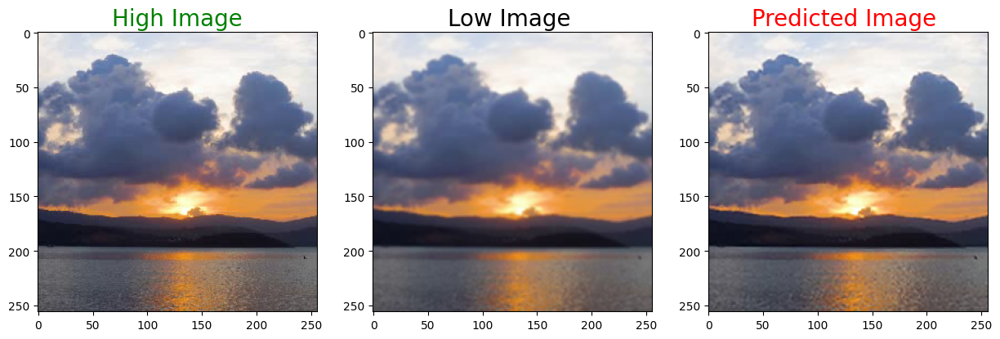

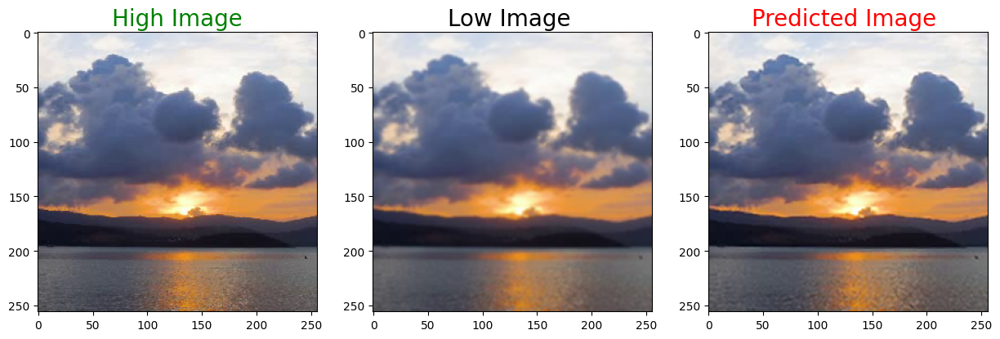

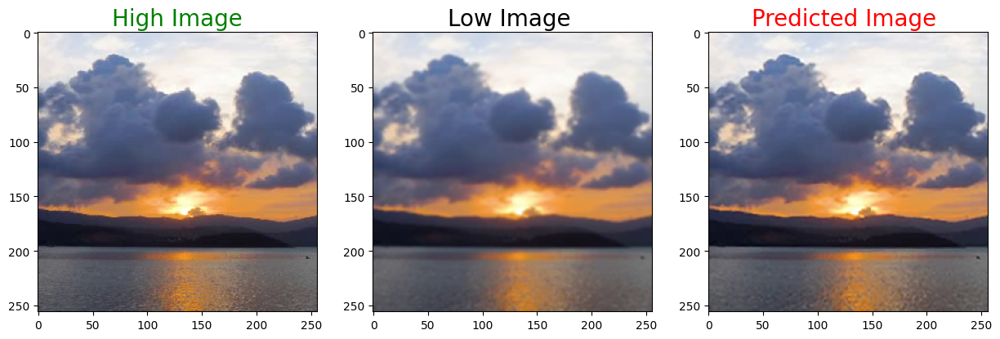

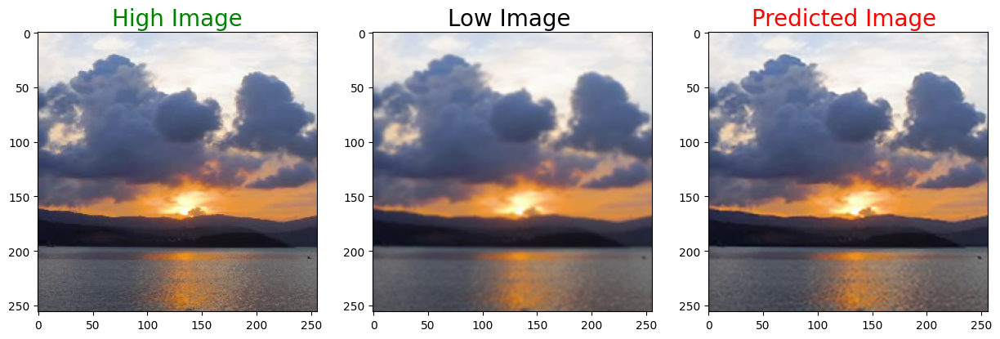

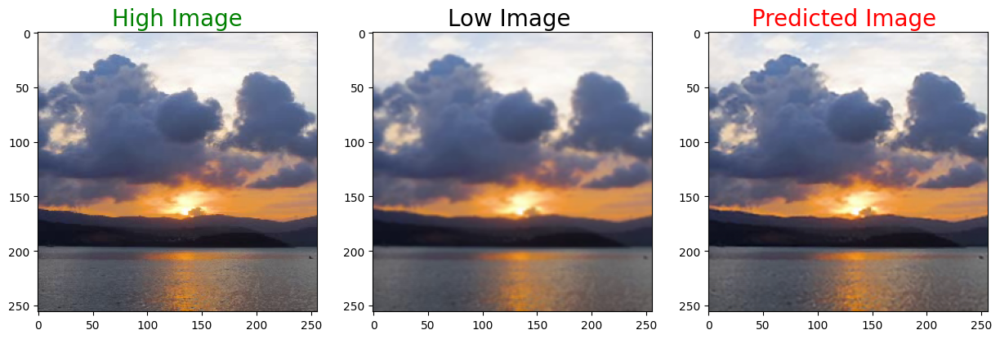

In [ ]:
dir_resize = '/content/drive/MyDrive/mit computer vision project/sky_resized.mp4'
dir_out_blur = '/content/drive/MyDrive/mit computer vision project/sky_blurred2.mp4'
dir_out_pred = '/content/drive/MyDrive/mit computer vision project/sky_prediciton2.mp4'
bf, pf = blurr_video_and_prediction(dir_resize, dir_out_blur, dir_out_pred)

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)


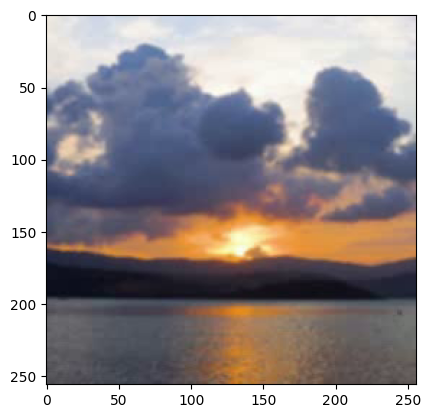

In [ ]:
temp = read_video_to_frames('/content/drive/MyDrive/mit computer vision project/sky_blurred2.mp4')
plt.imshow(temp[0])

# Video Processing (do not run)

In [ ]:
# # Load the input video
# cap = cv2.VideoCapture('/content/drive/MyDrive/mit computer vision project/sky.mp4')

# # Get the frame dimensions
# width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
# height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# # Calculate the center crop dimensions
# crop_size = min(width, height)
# x = (width - crop_size) // 2
# y = (height - crop_size) // 2

# # Create a video writer object
# fourcc = cv2.VideoWriter_fourcc(*'mp4v')
# out = cv2.VideoWriter('/content/drive/MyDrive/mit computer vision project/sky_resized.mp4', fourcc, 30, (256, 256))

# # Loop through the frames
# while True:
#     ret, frame = cap.read()
#     if not ret:
#         break
    
#     # Apply center crop
#     cropped_frame = frame[y:y+crop_size, x:x+crop_size]
    
#     # Resize to 256 by 256
#     resized_frame = cv2.resize(cropped_frame, (256, 256))
    
#     # Write the resized frame to the output video
#     out.write(resized_frame)
    
#     # Display the resized frame
#     #cv2_imshow(resized_frame)
    
#     # Exit on ESC key press
#     if cv2.waitKey(1) == 27:
#         break

# # Release the video capture, writer, and close all windows
# cap.release()
# out.release()
# cv2.destroyAllWindows()


In [ ]:
# save frames as images
# vidcap = cv2.VideoCapture('/content/drive/MyDrive/mit computer vision project/sky_prediction.mp4')
# success,image = vidcap.read()
# count = 0
# while success:
#   cv2.imwrite("/content/drive/MyDrive/mit computer vision project/sky_frames/sky_pred_frame%d.jpg" % count, image)     # save frame as JPEG file      
#   success,image = vidcap.read()
#   print('Read a new frame: ', success)
#   count += 1

In [ ]:
cap = cv2.VideoCapture('/content/drive/MyDrive/mit computer vision project/output videos metric=SSIM/dancer/dancer_resize.mp4')

fps = int(cap.get(cv2.CAP_PROP_FPS))

# list of video frames
frames = []

while(cap.isOpened()):
    # read frame from the video
    ret, frame = cap.read()
    
    if ret is False:
        break
    #frame = cv2.resize(frame, (256,256))
    #frame = frame[:, 80:80+240]
    frames.append(frame)

cap.release()

# scale frame to 0-1
#frames = np.array(frames) / 255.
frames = np.array(frames)
print("frames size:", frames.shape, "# (nb_frames, height, width, channel)")

# get height, width
numFrames = frames.shape[0]
height = frames.shape[1]
width = frames.shape[2]


frames size: (155, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
frames.shape[0]

155

In [ ]:
# need to change to frames.shape[0] to convert color scheme for any video

for i in range(frames.shape[0]):
  frames[i] = cv2.cvtColor(frames[i],cv2.COLOR_BGR2RGB)

In [ ]:
blurred_img = cv2.blur(frames[1],(3,3))

In [ ]:
predicted = np.clip(model.predict((blurred_img/255.).reshape(1, 256, 256, 3)), 0.0, 1.0).reshape(256, 256, 3)


1/1 [==============================] - 0s 32ms/step


### Compare HR, LR, SR from different Loss&Metrics

In [ ]:
# PSNR as metrics
plot_images(frames[1], blurred_img, predicted)

In [ ]:
dir = '/content/drive/MyDrive/mit computer vision project/output videos loss=MSE/sky/sky_prediction.mp4'
sky_sr = read_video_to_frames(dir)

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
dir1 = '/content/drive/MyDrive/mit computer vision project/output videos loss=MSE/wave/Waves_resized.mp4'

wave_hr = read_video_to_frames(dir1)

frames size: (346, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
dir1 = '/content/drive/MyDrive/mit computer vision project/output videos loss=MSE/sky/sky_blurred.mp4'
sky_lr = read_video_to_frames(dir1)

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)


### Generate frames for later video production

In [ ]:
frames.shape

(155, 256, 256, 3)

In [ ]:
# generate blurred frames for blurred video
blurred_frames = frames
for i in range(frames.shape[0]):
  blurred_frames[i] = cv2.blur(frames[i],(3,3))

In [ ]:
# generate SR frames for SR video
predicted_frames = np.empty((0, 256, 256, 3))
for i in range(frames.shape[0]):
  pred = np.clip(model.predict((blurred_frames[i]/255.).reshape(1, 256, 256, 3)), 0.0, 1.0).reshape(256, 256, 3)
  predicted_frames = np.append(predicted_frames, [pred], axis = 0)

1/1 [==============================] - 0s 25ms/step


In [ ]:
plt.imshow(frames[0])

In [ ]:
blurred_frames.shape

(155, 256, 256, 3)

In [ ]:
predicted_frames[0]

In [ ]:
for i in range(5):
  plt.figure(figsize=(10,10))
  plt.subplot(1,2,1)
  plt.title('High Resolution Imge', color = 'green', fontsize = 20)
  plt.imshow(predicted_frames[i])
  plt.axis('off')
  plt.subplot(1,2,2)
  plt.title('low Resolution Image ', color = 'black', fontsize = 20)
  plt.imshow(frames[i])
  plt.axis('off')

### generate blurred video and SR video

In [ ]:
# Define output blurred video path and parameters
out_path = '/content/drive/MyDrive/mit computer vision project/output videos metric=SSIM/cat/black_cat_blurred2.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(out_path, fourcc, fps, (width, height))

# Loop through the frames and write to the output video
for i in range(blurred_frames.shape[0]):
    # Convert BGR to RGB
    frame_rgb = cv2.cvtColor((blurred_frames[i]).astype(np.uint8), cv2.COLOR_BGR2RGB)
    out.write(frame_rgb)

# Release the output video and close all windows
out.release()

In [ ]:
resize_frames = read_video_to_frames('/content/drive/MyDrive/mit computer vision project/output videos metric=SSIM/sky/sky_resized.mp4')

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
plt.imshow(resize_frames[0])

In [ ]:
# Define output SR predicted video path and parameters
out_path = '/content/drive/MyDrive/mit computer vision project/output videos metric=SSIM/dancer/dancer_prediction.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(out_path, fourcc, fps, (256, 256))

# Loop through the frames and write to the output video
for i in range(predicted_frames.shape[0]):
    # Convert BGR to RGB
    frame_rgb = cv2.cvtColor((predicted_frames[i]*255).astype(np.uint8), cv2.COLOR_BGR2RGB)
    out.write(frame_rgb)

# Release the output video and close all windows
out.release()


In [ ]:
dir_in = '/content/drive/MyDrive/mit computer vision project/black_cat.mp4'
dir_out = '/content/drive/MyDrive/mit computer vision project/black_cat_resized.mp4'
resize_video(dir_in, dir_out)

1/1 [==============================] - 0s 24ms/step


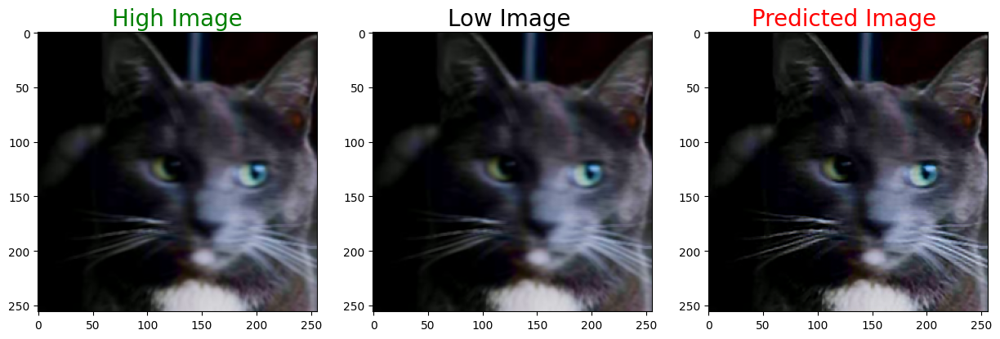

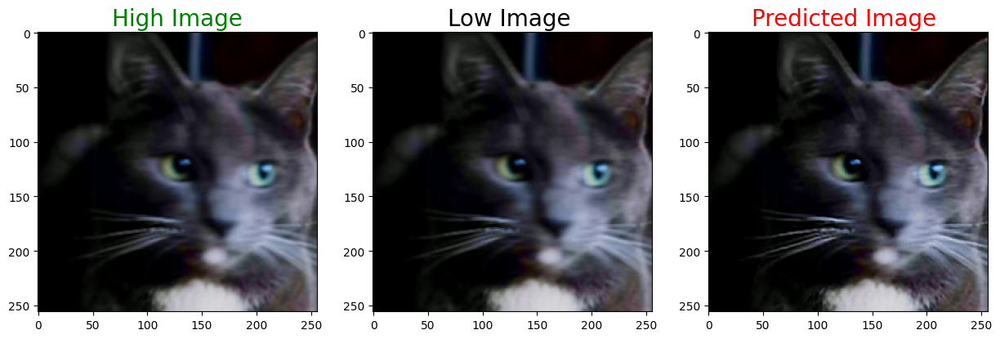

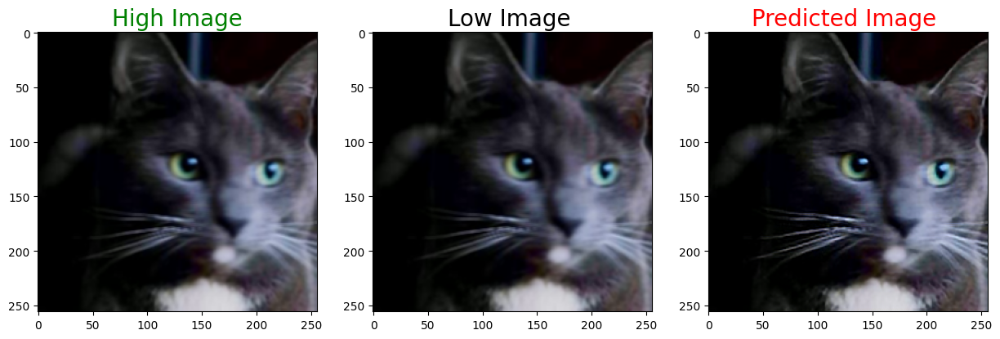

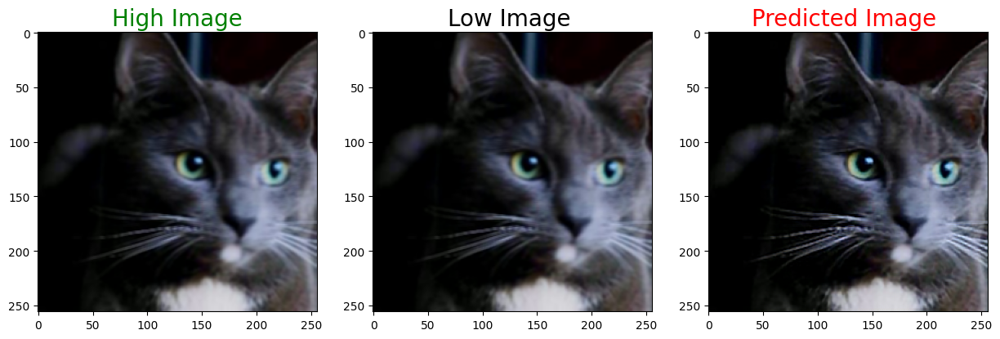

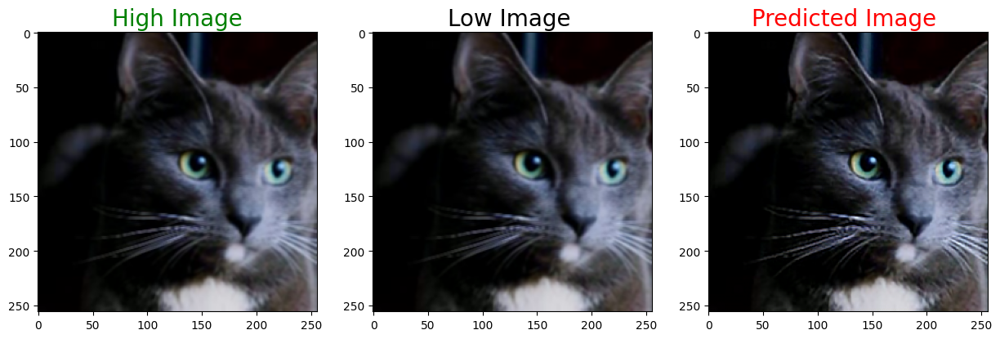

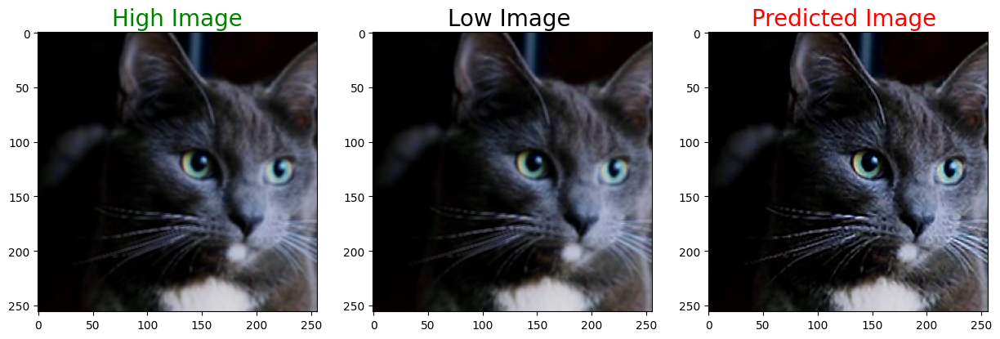

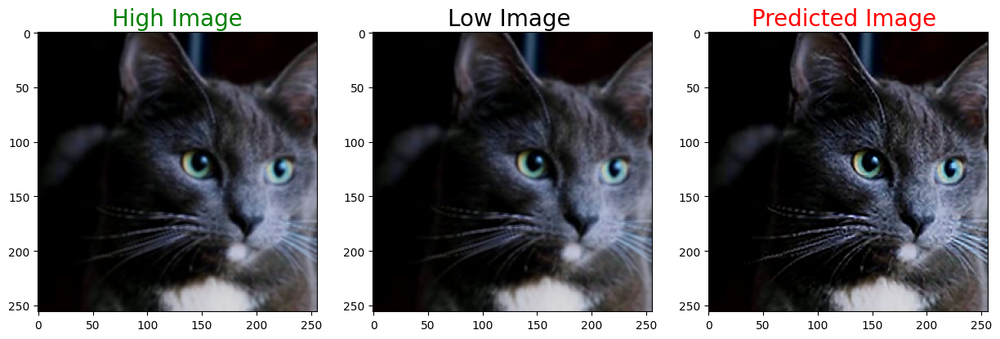

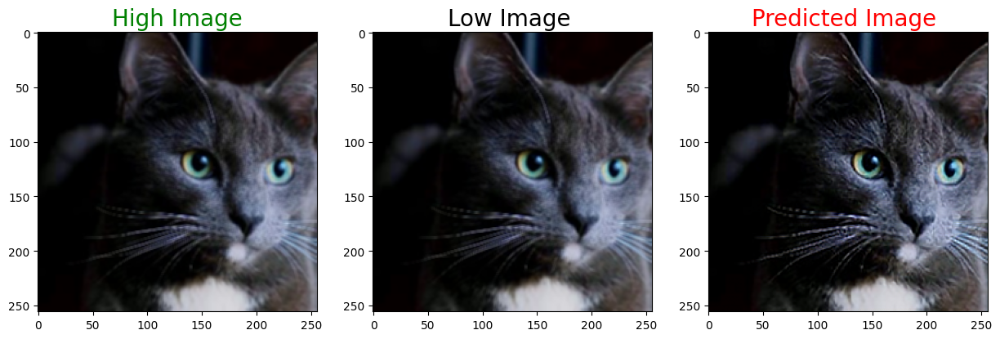

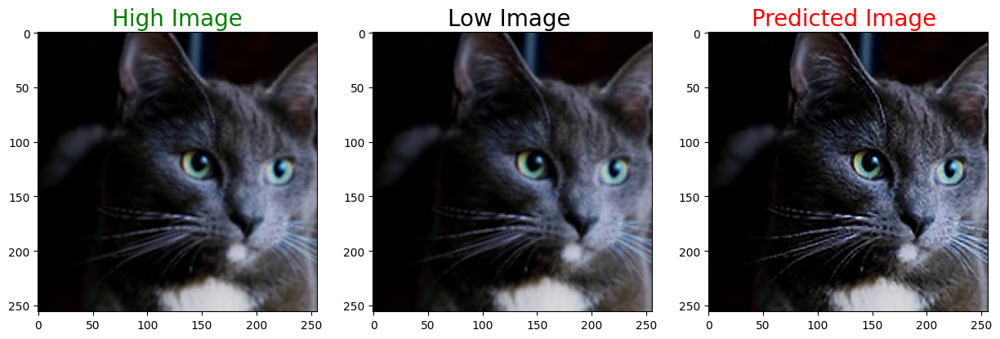

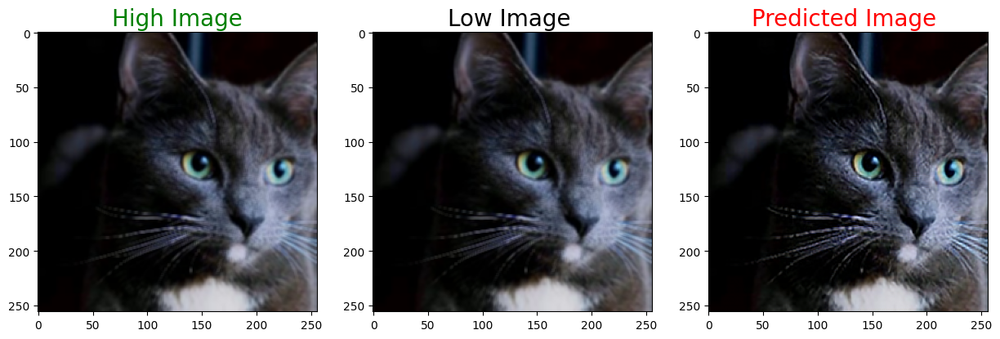

In [ ]:
dir_resize = '/content/drive/MyDrive/mit computer vision project/output videos loss=PSNR/cat/black_cat_resized.mp4'
dir_out_blur = '/content/drive/MyDrive/mit computer vision project/output videos loss=PSNR/cat/black_cat_blurred.mp4'
dir_out_pred = '/content/drive/MyDrive/mit computer vision project/output videos loss=PSNR/cat/black_cat_prediction.mp4'
blurr_video_and_prediction(dir_resize, dir_out_blur, dir_out_pred)

### displace first frame of LR, HR, SR video. Save separately for report

In [ ]:
plot_images(frames[0], blurred_frames[0], predicted_frames[0])

# Temporal Filter Helper Function
workflow:

1. use read_video_to_frames(dir) to import HR and LR frames from section above (if new session was not started, then there's no need to import) and use plot_before_after() to check the frames are correct
2. use optical_flows on low resolution frames to generate flow vectors
3. use generate_interpolated_frames on low resolution frames with flow vectors
4. use frame_upscale to generate high resolution 
5. use blend_interpolation_with_HR
6. save_video to save the video in the drive

In [ ]:
def generate_interpolated_frames(frames, flows):
    # create an empty list to store the interpolated frames
    interpolated_frames = []

    # iterate over every pair of consecutive frames and their optical flow vectors
    for i in range(frames.shape[0] - 1):
        # extract the two consecutive frames
        frame1 = frames[i]
        frame2 = frames[i + 1]

        # extract the optical flow vector between the two frames
        flow = flows[i]

        # generate 1 interpolated frames between the two consecutive frames
        for j in range(1, 2):
            # compute the time step for the interpolated frame
            t = j / 11.0

            # interpolate the two frames at time t
            interpolated_frame = cv2.addWeighted(frame1, 1.0 - t, frame2, t, 0.0)

            # compute the transformation matrix from the optical flow vector
            M = np.float32([[1, 0, t * flow[255, 255, 0]], [0, 1, t * flow[255, 255, 1]]])

            # warp the interpolated frame using the transformation matrix
            warped_interpolated_frame = cv2.warpAffine(interpolated_frame, M, (frame1.shape[1], frame1.shape[0]))

            interpolated_frames.append(warped_interpolated_frame)

    return np.array(interpolated_frames)

In [ ]:
def flow_to_image(flow, max_flow_mag=15.0):
    hsv = np.zeros((flow.shape[0], flow.shape[1], 3), dtype=np.uint8)
    hsv[..., 0] = (np.arctan2(flow[..., 1], flow[..., 0]) * 180 / np.pi / 2).astype(np.uint8)
    hsv[..., 1] = 255
    mag = np.linalg.norm(flow, axis=-1)  # compute magnitude along the last axis
    hsv[..., 2] = np.minimum(np.round(mag / max_flow_mag * 255), 255)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return bgr


In [ ]:
def optical_flows(lr_frames):
    first_frame = lr_frames[0]
    # Converts frame to grayscale because we only need the luminance channel for detecting edges - less computationally expensive
    prev_gray = cv2.cvtColor(first_frame, cv2.COLOR_BGR2GRAY)

    optical_flows = []

    # Creates an image filled with zero intensities with the same dimensions as the frame
    mask = np.zeros_like(first_frame)
      
    # Sets image saturation to maximum
    mask[..., 1] = 255

    for i in range(1, lr_frames.shape[0]):
        frame = lr_frames[i]

        # Converts each frame to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
      
        # Calculates dense optical flow by Farneback method
        flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
      
        # Store the flow vector as a 2D image (visualization purposes)
        flow_image = flow_to_image(flow)
      
        # Append the flow vector to the list of flows
        optical_flows.append(flow)
        
        # Store the current frame as the previous frame for the next iteration
        prev_gray = gray

    return np.array(optical_flows)

In [ ]:
def frame_upscale(frames):
  # scale frame to 0-1
  frames = frames / 255.
  #frames = np.array(frames)
  predicted_frames = np.zeros_like(frames)
  # predicted images
  for i in range(frames.shape[0]):
    pred = np.clip(model.predict((frames[i]).reshape(1, 256, 256, 3)), 0.0, 1.0).reshape(256, 256, 3)
    predicted_frames[i] = pred

  for i in range(5):
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(predicted_frames[i])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(frames[i])
    plt.axis('off')
  # # Define output video path and parameters
  # fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  # out = cv2.VideoWriter(dir_out, fourcc, fps, (width, height))

  # # Loop through the frames and write to the output video
  # for i in range(pr.shape[0]):
  #   # Convert BGR to RGB
  #     frame_rgb = cv2.cvtColor((blurred_frames[i]).astype(np.uint8), cv2.COLOR_BGR2RGB)
  #     out.write(frame_rgb)
  return predicted_frames

In [ ]:
def blend_interpolation_with_HR(upscaled_interpolation, hr_frames, alpha = 0.5):
    beta = 1 - alpha  # weight for the original frames

    blended_frames = []
    if np.any(upscaled_interpolation)>1:
      upscaled_interpolation =  upscaled_interpolation/255.
    if np.any(hr_frames)>1:
      hr_frames = hr_frames/255.
    # loop through the original frames and corresponding interpolated frames
    for i, (frame, interpolated_frame) in enumerate(zip(hr_frames[:hr_frames.shape[0]-1], upscaled_interpolation)):
        # blend the original frame and the interpolated frame
        #print(i)
        blended_frame = cv2.addWeighted(frame.astype(np.float32), beta, interpolated_frame.astype(np.float32), alpha, 0)

        blended_frames.append(blended_frame)
  
        # wait for a key press and exit if the user presses the 'q' key
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    blended_frames.append(upscaled_interpolation[upscaled_interpolation.shape[0]-1])


    cv2.destroyAllWindows()
    return np.array(blended_frames)

In [ ]:
def stack_interpolation(upscaled_interpolation, hr_frames):
    if np.any(upscaled_interpolation)>1:
      upscaled_interpolation =  upscaled_interpolation/255.
    if np.any(hr_frames)>1:
      hr_frames = hr_frames/255.
    
    frames = []
    # loop through the original frames and corresponding interpolated frames
    for i, (frame, interpolated_frame) in enumerate(zip(hr_frames[:hr_frames.shape[0]-1], upscaled_interpolation)):
        # blend the original frame and the interpolated frame
        #print(i)
        frames.append(frame)
        frames.append(interpolated_frame)

    frames.append(hr_frames[hr_frames.shape[0]-1])
    return(np.array(frames))

# Add temporal filter


In [ ]:
dir = '/content/drive/MyDrive/mit computer vision project/sky_prediction2.mp4'
sky_hr = read_video_to_frames(dir)

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
dir = '/content/drive/MyDrive/mit computer vision project/sky_blurred.mp4'
sky_lr = read_video_to_frames(dir)

frames size: (125, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
plot_before_after(sky_hr,sky_lr)

In [ ]:
optical_flows = optical_flows(sky_lr)

In [ ]:
optical_flows.shape

(124, 256, 256, 2)

In [ ]:
# Now that we have computed the optical flows, we can generate interpolated frames
interpolated_frames = generate_interpolated_frames(sky_lr, optical_flows)

In [ ]:
interpolated_frames.shape

(124, 256, 256, 3)

In [ ]:
plt.imshow(interpolated_frames[0])

In [ ]:
upscaled_interpolation = frame_upscale(interpolated_frames)

In [ ]:
blended_frames = blend_interpolation_with_HR(upscaled_interpolation, sky_hr)
for i in range(5):
  plt.imshow(blended_frames[i])
  plt.show()

In [ ]:
blended_frames.shape

(125, 256, 256, 3)

In [ ]:
for i in range(upscaled_interpolation.shape[0]):
  print(i)
  plt.imshow(upscaled_interpolation[i])
  plt.show()

In [ ]:
blended_frames2 = blend_interpolation_with_HR(upscaled_interpolation, sky_hr, alpha = 0.2)

In [ ]:
blended_frames2.shape

(125, 256, 256, 3)

In [ ]:
# compare interpolated frame and hr frames
plot_before_after(upscaled_interpolation, sky_hr)

In [ ]:
stack_frames = stack_interpolation(upscaled_interpolation, sky_hr)

In [ ]:
save_video(blended_frames2, '/content/drive/MyDrive/mit computer vision project/sky_blended_02.mp4')

In [ ]:
save_video(upscaled_interpolation, '/content/drive/MyDrive/mit computer vision project/sky_interpolation2.mp4')

In [ ]:
save_video(np.array(stack_frames), '/content/drive/MyDrive/mit computer vision project/sky_interpolation_stack.mp4')

# dancer

In [ ]:
resize_video('/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer.mp4', '/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer_resize.mp4')

In [ ]:
dir_in = '/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer_resize.mp4'
dir_out_blur = '/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer_blur.mp4'
dir_out_pred = '/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer_prediction.mp4'
blurred_frames, predicted_frames = blurr_video_and_prediction(dir_in, dir_out_blur, dir_out_pred)

In [ ]:
flows= optical_flows(blurred_frames)

In [ ]:
dancer_interpolate_lr = generate_interpolated_frames(blurred_frames, flows)

In [ ]:
plt.imshow(dancer_interpolate_lr[0])

In [ ]:
dancer_interpolate_hr = frame_upscale(dancer_interpolate_lr)

In [ ]:
dancer_blend = blend_interpolation_with_HR(dancer_interpolate_hr, predicted_frames)

In [ ]:
plt.imshow(dancer_blend[1])

In [ ]:
save_video(dancer_blend, '/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer_blend.mp4')

In [ ]:
dancer_stack = stack_interpolation(dancer_interpolate_hr, predicted_frames)

In [ ]:
plt.imshow(dancer_stack[0])

In [ ]:
save_video(np.array(dancer_stack), '/content/drive/MyDrive/mit computer vision project/output videos/dancer/dancer_stack.mp4', fps = 60)

# wave

In [ ]:
wave_hr = read_video_to_frames('/content/drive/MyDrive/mit computer vision project/output videos/wave/Waves_predicted.mp4')
wave_lr = read_video_to_frames('/content/drive/MyDrive/mit computer vision project/output videos/wave/Waves_blurred.mp4')

frames size: (346, 256, 256, 3) # (nb_frames, height, width, channel)
frames size: (346, 256, 256, 3) # (nb_frames, height, width, channel)


In [ ]:
plot_before_after(wave_hr, wave_lr)

In [ ]:
wave_hr.shape, wave_lr.shape

((346, 256, 256, 3), (346, 256, 256, 3))

In [ ]:
wave_flows = optical_flows(wave_lr)

In [ ]:
wave_interpolate_lr = generate_interpolated_frames(wave_lr, wave_flows)

In [ ]:
plt.imshow(wave_interpolate_lr[0])

In [ ]:
wave_interpolate_hr = frame_upscale(wave_interpolate_lr)

In [ ]:
wave_blend = blend_interpolation_with_HR(wave_interpolate_hr, wave_hr/255.)

In [ ]:
plt.imshow(wave_blend[0])

In [ ]:
save_video(wave_blend, '/content/drive/MyDrive/mit computer vision project/output videos/wave/Waves_blend.mp4')

In [ ]:
wave_stack = stack_interpolation(wave_interpolate_hr, wave_hr/255.)

In [ ]:
save_video(np.array(wave_stack), '/content/drive/MyDrive/mit computer vision project/output videos/wave/Waves_stack.mp4')

# Thank You !!!